In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Points Detection

In [5]:
FOLDER_PATH = '/content/drive/MyDrive/Fundas Images/'

def load_image(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Warning: Could not load image at {path}. Skipping.")
    return img

In [6]:
def apply_manual_filter(image, kernel):

    kernel = np.array(kernel)
    k_h, k_w = kernel.shape
    img_h, img_w = image.shape

    pad_h = k_h // 2
    pad_w = k_w // 2

    padded_img = np.zeros((img_h + 2 * pad_h, img_w + 2 * pad_w), dtype=np.float32)
    padded_img[pad_h:-pad_h, pad_w:-pad_w] = image

    output = np.zeros_like(image, dtype=np.float32)

    for y in range(img_h):
        for x in range(img_w):
            region = padded_img[y:y+k_h, x:x+k_w]
            output[y, x] = np.sum(region * kernel)

    return output

In [7]:
def plot_results(images, titles, rows, cols, figsize=(15, 5)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Handle single plot edge case
    if rows * cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Processing Image: fundas0.jpg


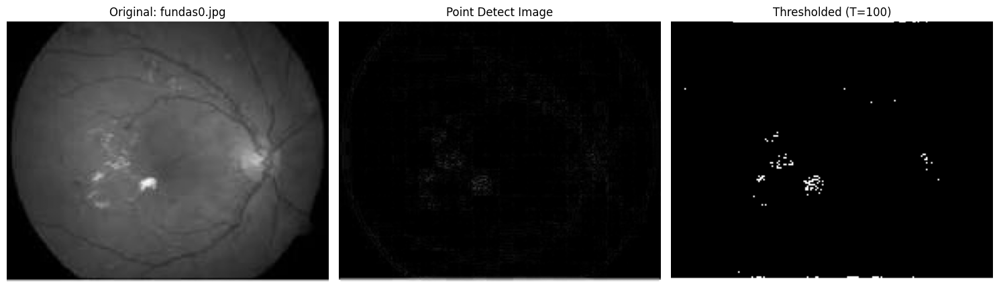

Processing Image: fundas1.jpg


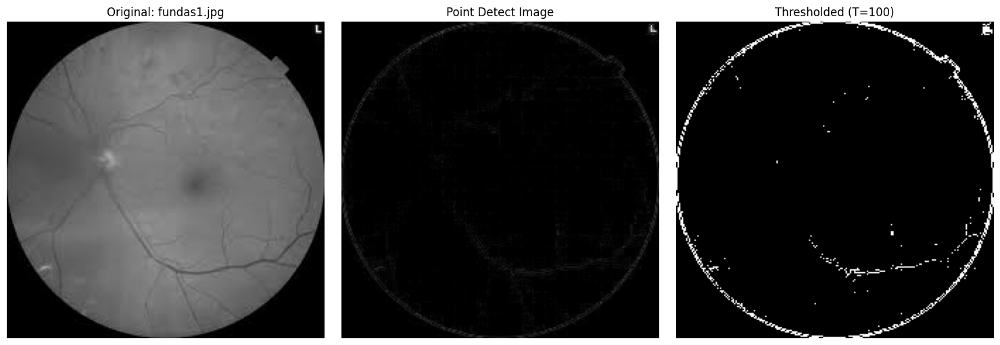

Processing Image: fundas2.jpg


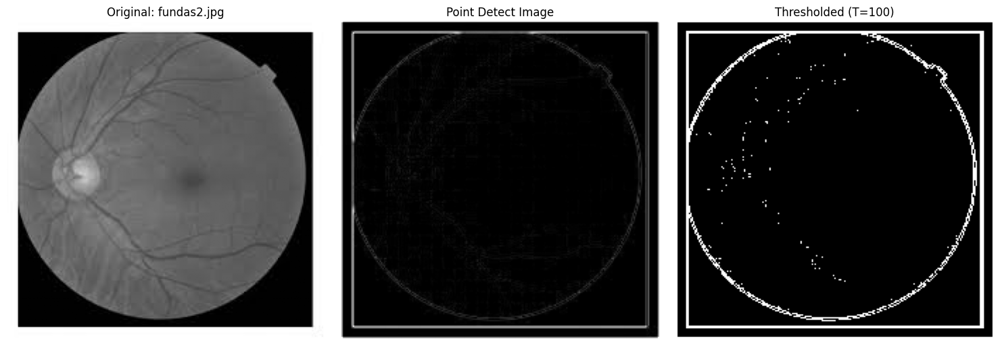

Processing Image: fundas3.jpg


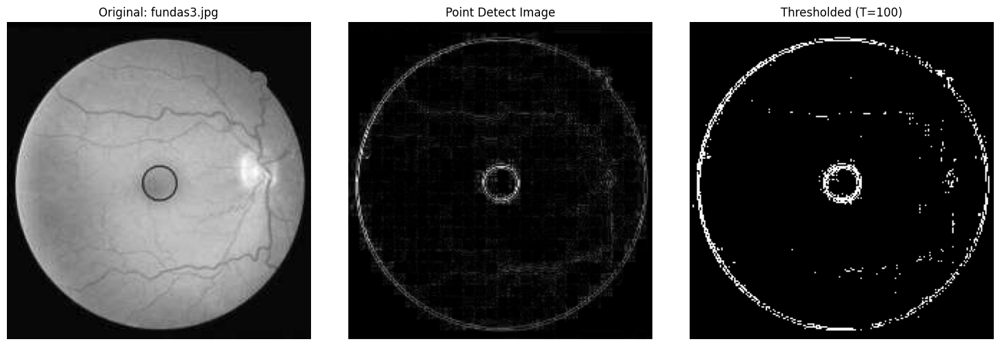

Processing Image: fundas5.jpg


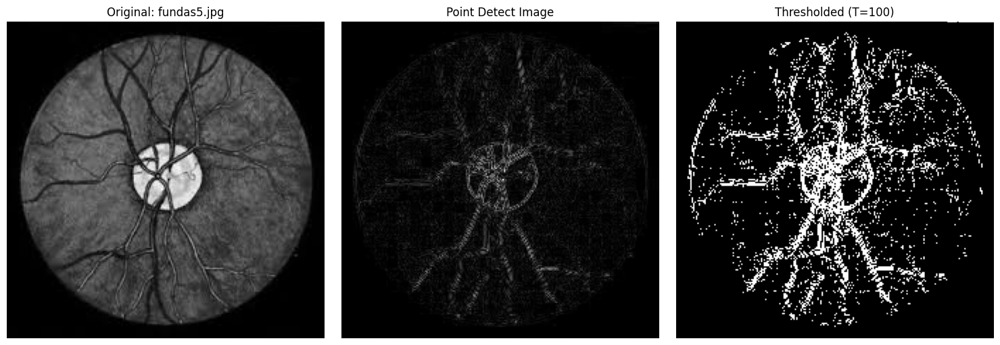

Processing Image: fundas6.png


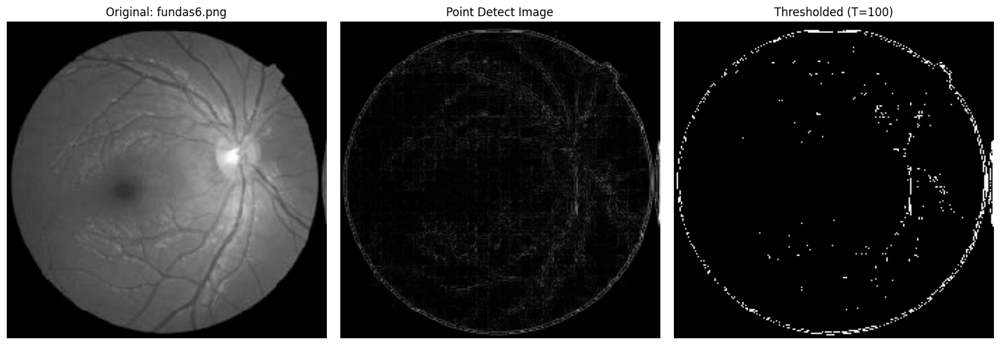

Processing Image: fundas4.jpg


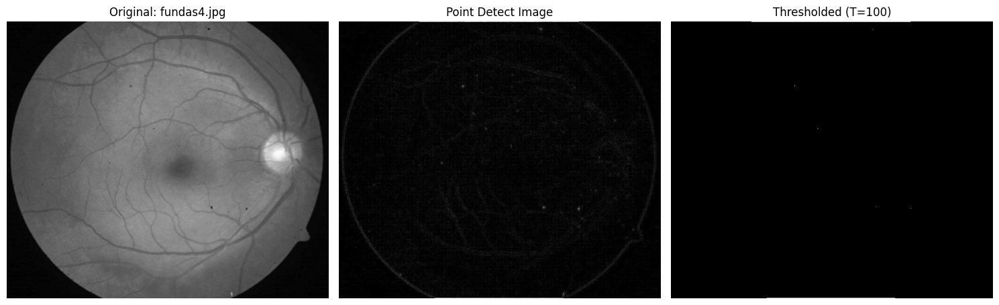

Processing Image: fundas8.jpg


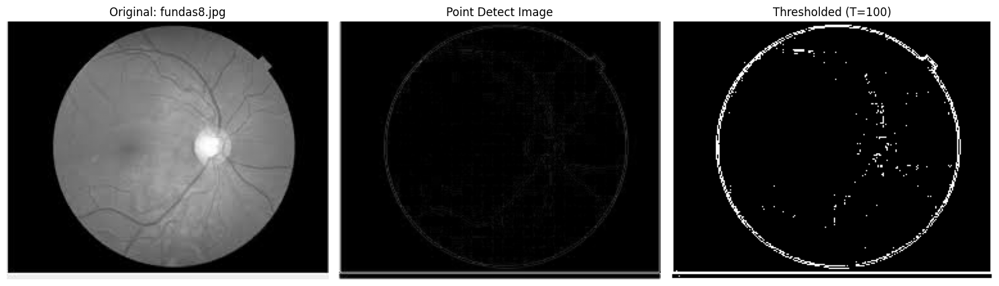

Processing Image: fundas9.jpg


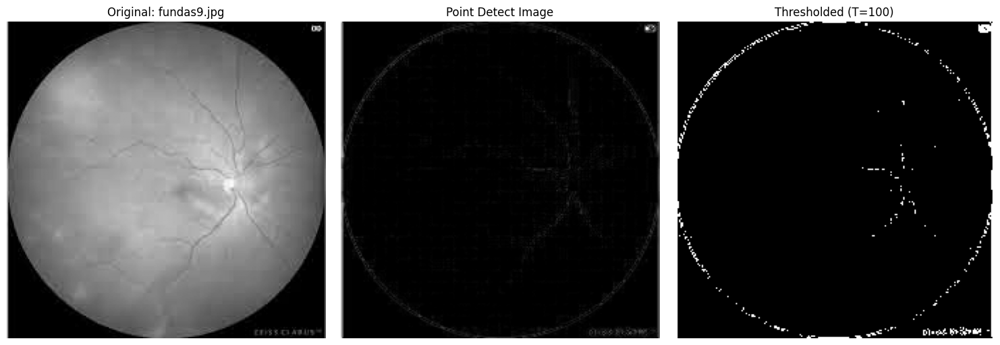

In [9]:
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff')

if not os.path.exists(FOLDER_PATH):
    print(f"Error: The folder '{FOLDER_PATH}' does not exist. Please check your path.")
else:

    for filename in os.listdir(FOLDER_PATH):
        if filename.lower().endswith(valid_extensions):
            image_path = os.path.join(FOLDER_PATH, filename)

            print(f"Processing Image: {filename}")

            img = load_image(image_path)

            if img is not None:


                point_kernel = [[-1, -1, -1], [-1,  8, -1], [-1, -1, -1]]
                point_img = apply_manual_filter(img, point_kernel)
                point_img_abs = np.abs(point_img)

                threshold_value = 100
                thresholded_img = np.zeros_like(point_img_abs)
                thresholded_img[point_img_abs > threshold_value] = 255

                plot_results(
                    [img, point_img_abs, thresholded_img],
                    [f'Original: {filename}', 'Point Detect Image', f'Thresholded (T={threshold_value})'],
                    1, 3
                )

## Line Detection

Line Detection for: fundas0.jpg 


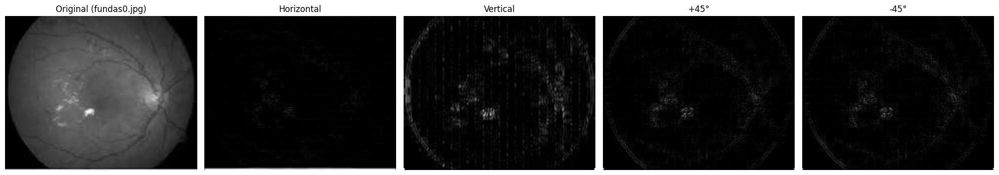

Line Detection for: fundas1.jpg 


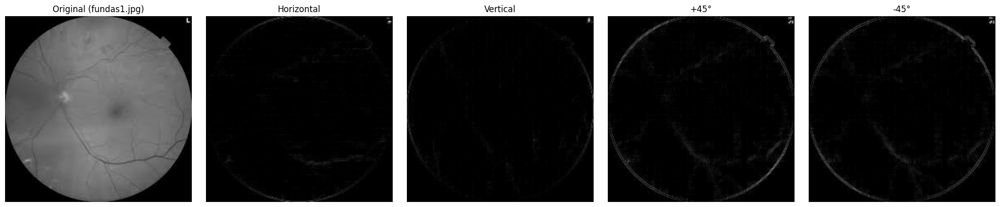

Line Detection for: fundas2.jpg 


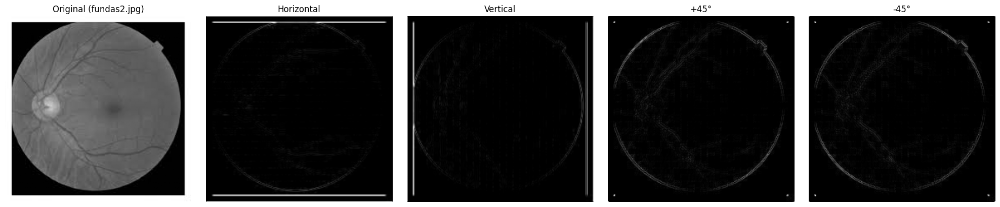

Line Detection for: fundas3.jpg 


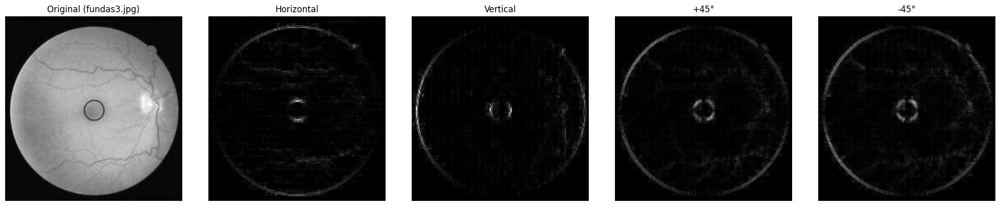

Line Detection for: fundas5.jpg 


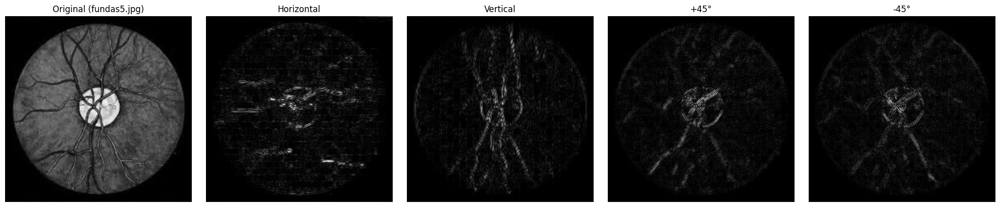

Line Detection for: fundas6.png 


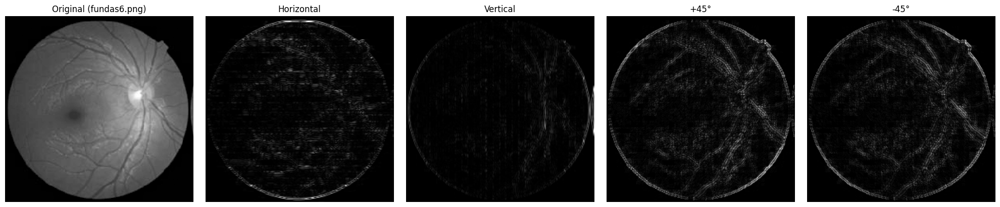

Line Detection for: fundas4.jpg 


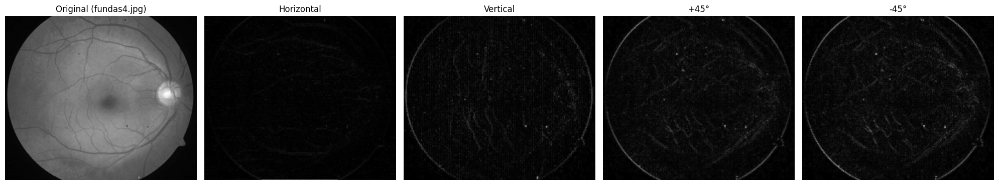

Line Detection for: fundas8.jpg 


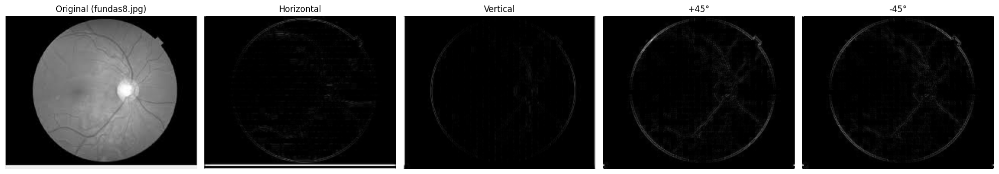

Line Detection for: fundas9.jpg 


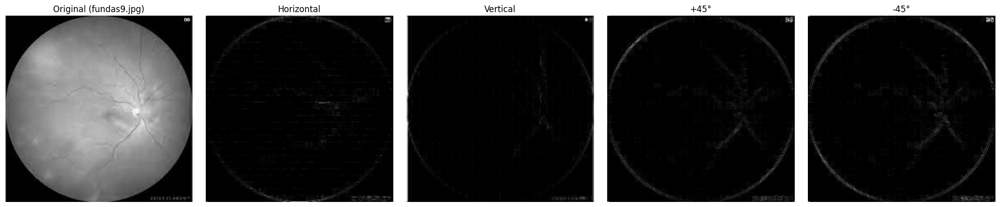

In [13]:
for filename in os.listdir(FOLDER_PATH):
    if filename.lower().endswith(valid_extensions):
        image_path = os.path.join(FOLDER_PATH, filename)
        img = load_image(image_path)

        if img is not None:
            print(f"Line Detection for: {filename} ")

            horiz_kernel = [[-1, -1, -1],
                            [ 2,  2,  2],
                            [-1, -1, -1]]

            vert_kernel  = [[-1,  2, -1],
                            [-1,  2, -1],
                            [-1,  2, -1]]

            p45_kernel   = [[-1, -1,  2],
                            [-1,  2, -1],
                            [ 2, -1, -1]]

            m45_kernel   = [[ 2, -1, -1],
                            [-1,  2, -1],
                            [-1, -1,  2]]

            line_horiz = apply_manual_filter(img, horiz_kernel)
            line_vert  = apply_manual_filter(img, vert_kernel)
            line_p45   = apply_manual_filter(img, p45_kernel)
            line_m45   = apply_manual_filter(img, m45_kernel)

            plot_results(
                [img, np.abs(line_horiz), np.abs(line_vert), np.abs(line_p45), np.abs(line_m45)],
                [f'Original ({filename})', 'Horizontal', 'Vertical', '+45°', '-45°'],
                1, 5, figsize=(20, 4)
            )

## Edge Detection (Before & After Smoothing)


Processing Edges for: fundas0.jpg


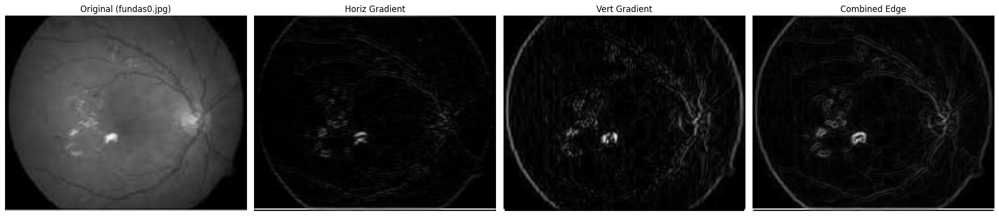

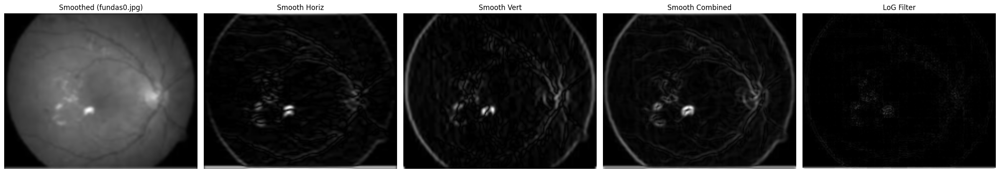


Processing Edges for: fundas1.jpg


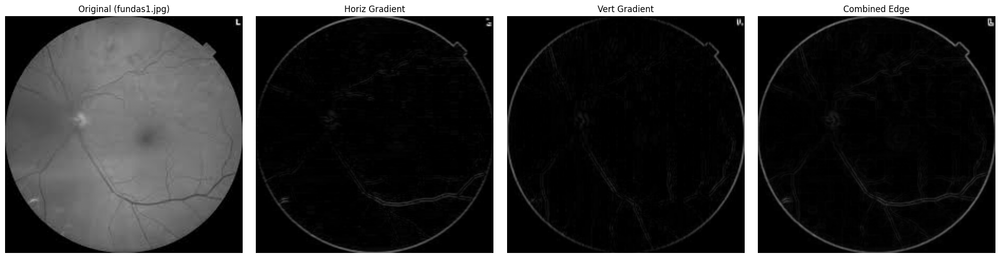

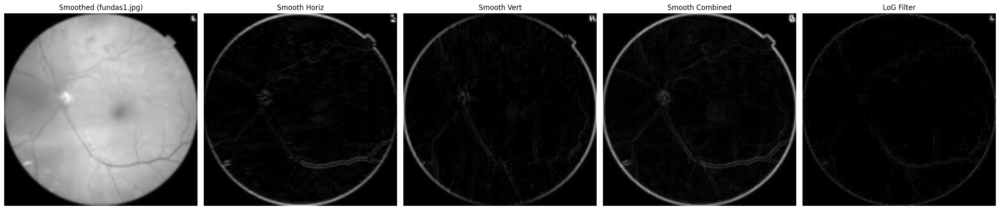


Processing Edges for: fundas2.jpg


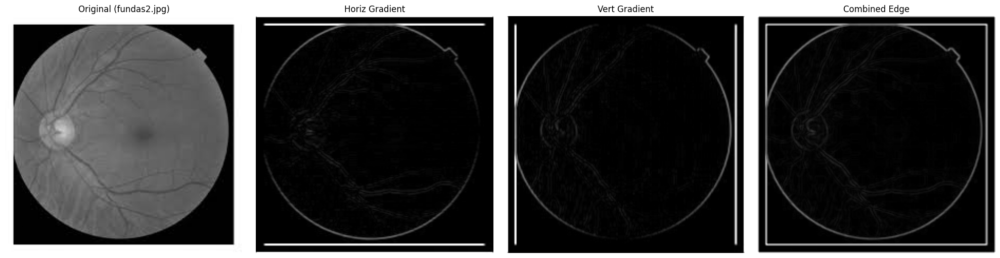

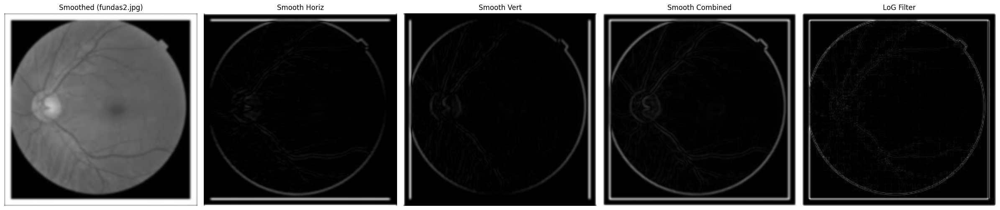


Processing Edges for: fundas3.jpg


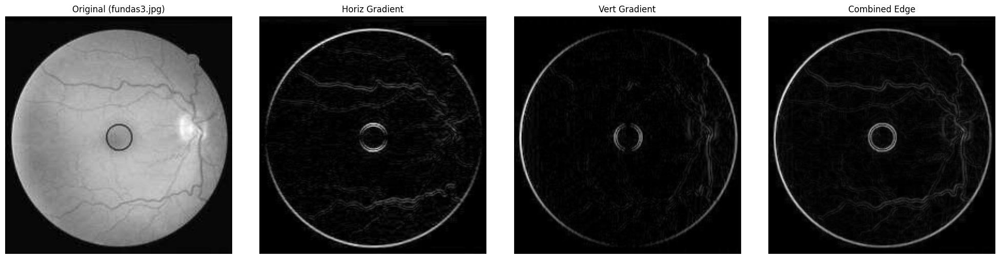

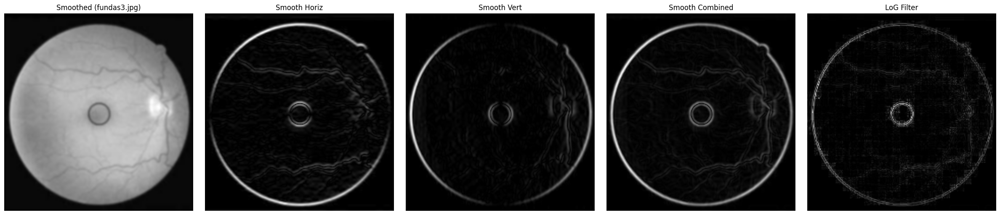


Processing Edges for: fundas5.jpg


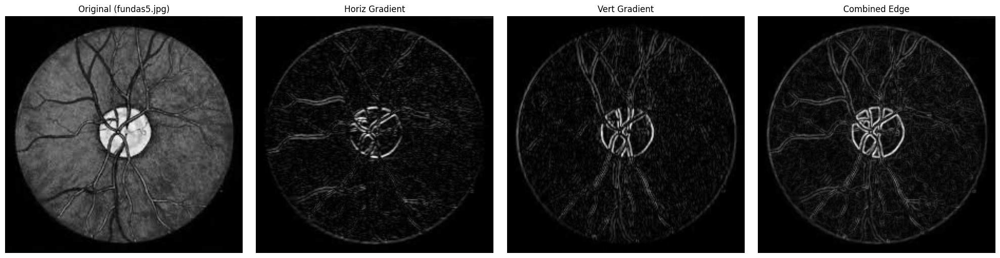

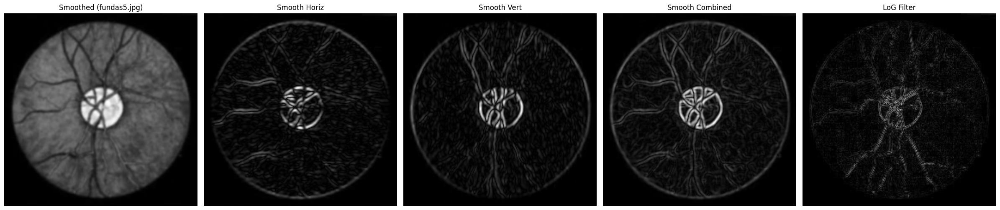


Processing Edges for: fundas6.png


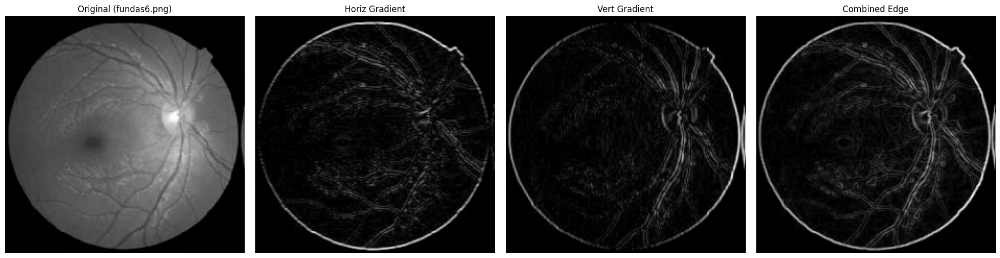

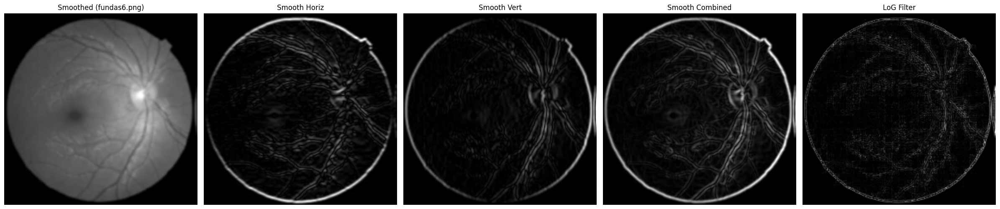


Processing Edges for: fundas4.jpg


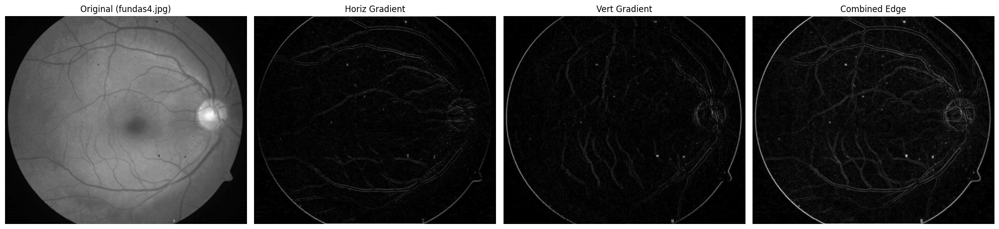

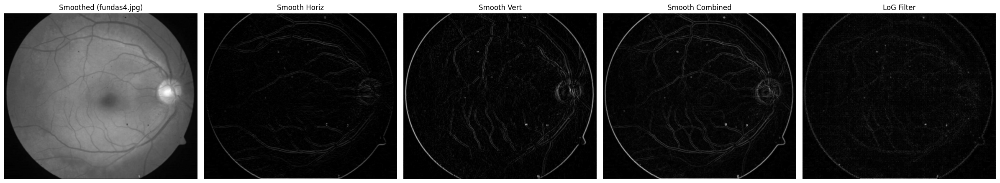


Processing Edges for: fundas8.jpg


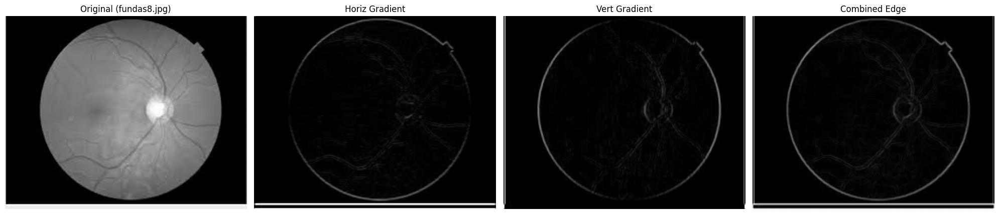

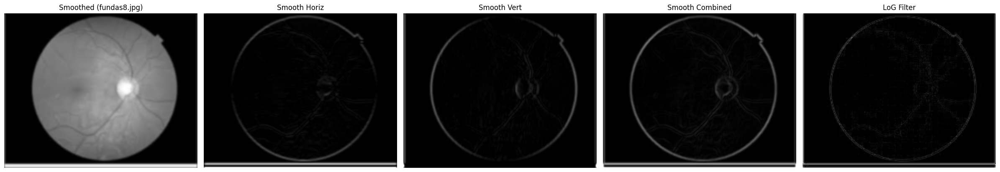


Processing Edges for: fundas9.jpg


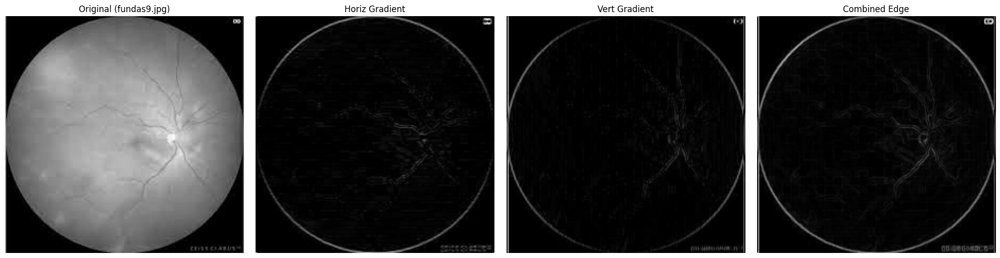

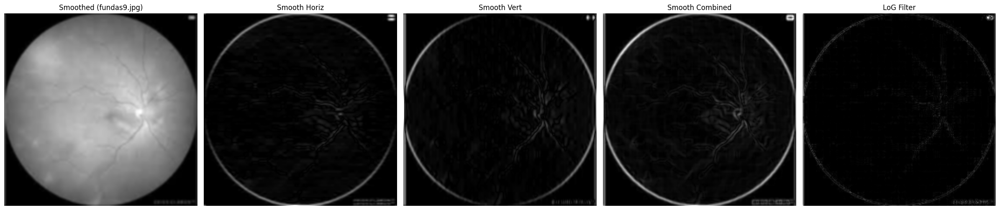

In [14]:
for filename in os.listdir(FOLDER_PATH):
    if filename.lower().endswith(valid_extensions):
        image_path = os.path.join(FOLDER_PATH, filename)

        img = load_image(image_path)

        if img is not None:
            print(f"\nProcessing Edges for: {filename}")

            sobel_x = [[-1, -2, -1],
                       [ 0,  0,  0],
                       [ 1,  2,  1]]

            sobel_y = [[-1,  0,  1],
                       [-2,  0,  2],
                       [-1,  0,  1]]

            # --- Part 1: Before Smoothing ---
            edge_x = apply_manual_filter(img, sobel_x)
            edge_y = apply_manual_filter(img, sobel_y)
            edge_combined = np.abs(edge_x) + np.abs(edge_y)

            plot_results(
                [img, np.abs(edge_x), np.abs(edge_y), edge_combined],
                [f'Original ({filename})', 'Horiz Gradient', 'Vert Gradient', 'Combined Edge'],
                1, 4, figsize=(20, 5)
            )

            # --- Part 2: After Smoothing (Gaussian + Sobel, and Laplacian of Gaussian) ---
            gaussian_kernel = np.array([
                [1,  4,  7,  4, 1],
                [4, 16, 26, 16, 4],
                [7, 26, 41, 26, 7],
                [4, 16, 26, 16, 4],
                [1,  4,  7,  4, 1]
            ]) / 273.0

            smoothed_img = apply_manual_filter(img, gaussian_kernel)

            smooth_edge_x = apply_manual_filter(smoothed_img, sobel_x)
            smooth_edge_y = apply_manual_filter(smoothed_img, sobel_y)
            smooth_edge_combined = np.abs(smooth_edge_x) + np.abs(smooth_edge_y)

            log_kernel = [
                [ 0,  0, -1,  0,  0],
                [ 0, -1, -2, -1,  0],
                [-1, -2, 16, -2, -1],
                [ 0, -1, -2, -1,  0],
                [ 0,  0, -1,  0,  0]
            ]

            log_img = apply_manual_filter(img, log_kernel)

            plot_results(
                [smoothed_img, np.abs(smooth_edge_x), np.abs(smooth_edge_y), smooth_edge_combined, np.abs(log_img)],
                [f'Smoothed ({filename})', 'Smooth Horiz', 'Smooth Vert', 'Smooth Combined', 'LoG Filter'],
                1, 5, figsize=(24, 5)
            )